In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

# **Завантаження попередньо підготовлених датасетів**

In [2]:
path_users = './data/Normalized_dataset_users.csv'
path_features = './data/Normalized_dataset_features.csv'
path_user_profiles = './data/User_Profiles.csv'
path_user_profiles_KMEANS = './data/User_Profiles_clusterized.csv'
path_user_profiles_Hierarchical = './data/User_Profiles_hierarchical_clusterized.csv'

In [3]:
path_matrix_zero = './data/filled_clustered/filled_kmeans_zero.csv'
path_matrix_one = './data/filled_clustered/filled_kmeans_one.csv'
path_matrix_two = './data/filled_clustered/filled_kmeans_two.csv'
path_matrix_three = './data/filled_clustered/filled_kmeans_three.csv'
path_matrix_four = './data/filled_clustered/filled_kmeans_four.csv'

In [4]:
df_users = pd.read_csv(path_users, on_bad_lines='skip')
df_users.shape

(9711301, 4)

In [5]:
df_features = pd.read_csv(path_features, on_bad_lines='skip')
df_features.shape

(50683, 18)

In [6]:
df_profiles = pd.read_csv(path_user_profiles, on_bad_lines='skip', index_col='Unnamed: 0')
df_profiles.shape

(1000, 12)

In [7]:
df_profiles.sample()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
c39f629aeb807eb60111b0dbd13714deef694f52,0.550841,0.574826,0.468078,0.781414,0.534351,0.060594,0.320641,0.508228,0.188774,0.393789,0.508781,0.774046


In [8]:
df_profiles_clustered_kmeans = pd.read_csv(path_user_profiles_KMEANS, on_bad_lines='skip', index_col='user_id')
df_profiles_clustered_kmeans.shape

(1000, 13)

In [9]:
df_profiles_clustered_kmeans.sample()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,cluster_k_5
user_id,,,,,,,,,,,,,
214656cb61c03a38e5ef325570dd96edd2034f2e,0.564803,0.656657,0.509856,0.807712,0.533981,0.074674,0.246608,0.331273,0.213125,0.470733,0.523948,0.784466,1


In [10]:
df_profiles_clustered_kmeans.columns = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'cluster']

In [11]:
df_profiles_clustered_kmeans.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'cluster'],
      dtype='object')

In [12]:
df_profiles_clustered_hierarchical = pd.read_csv(path_user_profiles_Hierarchical, on_bad_lines='skip', index_col='user_id')
df_profiles_clustered_hierarchical.shape

(1000, 13)

In [13]:
df_profiles_clustered_hierarchical.sample()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,cluster
user_id,,,,,,,,,,,,,
34dca9174bfbc5d6a24340ac22f3e92ab6766ca9,0.494142,0.761832,0.466082,0.812978,0.609137,0.110931,0.172422,0.311974,0.221422,0.419871,0.523308,0.775635,1


In [14]:
df_profiles_clustered_hierarchical.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'cluster'],
      dtype='object')

In [15]:
df_users = df_users.merge(df_profiles_clustered_kmeans['cluster'], left_on='user_id', right_index=True)

In [16]:
df_users.columns = ['track_id', 'user_id', 'playcount', 'playcount_norm', 'kmeans_cluster']

In [17]:
df_users = df_users.merge(df_profiles_clustered_hierarchical['cluster'], left_on='user_id', right_index=True)
df_users.columns = ['track_id', 'user_id', 'playcount', 'playcount_norm', 'kmeans_cluster', 'hierarchical_cluster']

In [18]:
df_filled_matrix_zero = pd.read_csv(path_matrix_zero, on_bad_lines='skip', index_col='user_id')
df_filled_matrix_one = pd.read_csv(path_matrix_one, on_bad_lines='skip', index_col='user_id')
df_filled_matrix_two = pd.read_csv(path_matrix_two, on_bad_lines='skip', index_col='user_id')
df_filled_matrix_three = pd.read_csv(path_matrix_three, on_bad_lines='skip', index_col='user_id')
df_filled_matrix_four = pd.read_csv(path_matrix_four, on_bad_lines='skip', index_col='user_id')

In [19]:
df_filled_matrix_zero.columns.name = 'track_id'
df_filled_matrix_one.columns.name = 'track_id'
df_filled_matrix_two.columns.name = 'track_id'
df_filled_matrix_three.columns.name = 'track_id'
df_filled_matrix_four.columns.name = 'track_id'

In [20]:
clusters = {
    0: df_filled_matrix_zero,
    1: df_filled_matrix_one,
    2: df_filled_matrix_two,
    3: df_filled_matrix_three,
    4: df_filled_matrix_four
}

### **Оберемо декілька випадкових користувачів для експерименту**

In [25]:
unique_users = df_profiles.index.values
np.random.shuffle(unique_users)
unique_users = unique_users[:20]

In [26]:
unique_users

array(['83091a7e80d342d26edca3c56215c60520c99b02',
       '37b15f2c47bcf8cd3c3891a215154bf0d08df2a4',
       '780085cf7345343488d021fa5ffe30c018a69992',
       '99c483a27234281d69511eb2321267d77430aa6d',
       '4a5ac559ccf0bddb4a3fa5011482fd8016984f0d',
       '3b93435988354b1889de1e71810d1dd65c4ba17c',
       '35ee179ddf1672c2202d01c7240d85b0919ac270',
       'fce4538d7a099bab3ef81533a76be87891f15f5f',
       'f3825861e5575cf4206f883630754fa30c80721e',
       '999ef0f2add07810255a5f6e5629b796a04c4b89',
       '14e0ed2417792d3a950469330a10f1cd1f07e7ec',
       'a771391d088269c5dc7adcc9e7e0e77d3cf8b80b',
       'd9e5124935aebeb6b9b169df2d28e1fc658d3566',
       'b4b3b685d2b73f7e62332e312ee1f33208c52851',
       'e2efdaa6343eb453d4a63e90d4de9e989c089171',
       'cf487887e35d1bfb9a08cb1a8db63ad4fdb4f42e',
       '944bf0ef4827e3ac4bbe5f25fd1a5c0136266767',
       'ae2ba20b5de1344b67febe32680e027ef97c28ee',
       '1fda2164de0016a9b9e2514adf26437a21c20c47',
       '3a34be849c7377037ecb436

In [27]:
features = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature']

# **Автоматизація процесу рекомендацій (базується на контенті)**

In [28]:
def get_content_based_recommendations(user_profile, tracks_df, features):
  def manhattan_distance(user_profile, track_row):
    user_profile = np.asarray(user_profile)
    track_row = np.asarray(track_row)
    return np.sum(np.abs(user_profile - track_row))

  df = tracks_df[features]
  return df.apply(lambda track: manhattan_distance(user_profile.iloc[0].astype(float), track.astype(float)), axis=1)

In [29]:
def get_features_of_content_based_recommended_tracks(user_profile, tracks_df, features, limit, sort=True):
    recs = get_content_based_recommendations(user_profile, tracks_df, features)
    recommendations_with_features = pd.concat([df_features, recs.rename('distance')], axis=1)
    if sort:
        recommendations_with_features = recommendations_with_features.sort_values(by='distance')

    if limit > 0:
        recommendations_with_features = recommendations_with_features.iloc[:limit]
    return recommendations_with_features

# **Автоматизація процесу рекомендацій (колаборативна фільтрація)**

In [30]:
def get_user_to_user_recommendations(user_track_matrix, user_df, user_id, limit, sort=True):
    filtered_user_df = user_df[user_df['user_id'] == user_id]
    listened_tracks = filtered_user_df['track_id'].values

    user_matrix = user_track_matrix[user_track_matrix.index == user_id]
    not_zero_ratings = user_matrix.loc[:, (user_matrix != 0).all()]

    recommended_tracks = set(listened_tracks).symmetric_difference(not_zero_ratings.columns)
    filtered_user_row = not_zero_ratings[list(recommended_tracks)]

    if limit <= 0:
        limit = filtered_user_row.shape[1]
    
    if sort:
        top_recommendations = filtered_user_row.loc[:, filtered_user_row.loc[user_id].sort_values(ascending=False).head(limit).index]
    else:
        top_recommendations = filtered_user_row.loc[:, filtered_user_row.loc[user_id].head(limit).index]
        
    return top_recommendations

In [31]:
def get_features_of_recommended_tracks(recs, df_features):
    result = df_features.merge(recs.transpose(), on='track_id', how='inner')
    result.rename(columns={recs.index.values[0]: 'similarity'}, inplace=True)
    return result

# **Автоматизація процесу рекомендацій (гібрид)**

In [38]:
# def get_user_to_user_recommendations(user_track_matrix, user_df, user_id, limit):
# def get_features_of_recommended_tracks(recs, df_features):
# def get_content_based_recommendations(user_profile, tracks_df, features):
# get_features_of_content_based_recommended_tracks(user_profile, tracks_df, features, limit):

def get_recommendations_first(user_track_matrix_dict, user_profile, users_df, df_features, features, limit):
    user_id = user_profile.index[0]
    user_cluster = users_df[users_df['user_id'] == user_id]['kmeans_cluster'].values[0]
    user_track_matrix = user_track_matrix_dict[user_cluster]
    
    recs_collab = get_features_of_recommended_tracks(
        get_user_to_user_recommendations(
            user_track_matrix, users_df, user_id, limit
        ), df_features
    )

    recs_content_based = get_features_of_content_based_recommended_tracks(
        user_profile, df_features, features, limit
    )
    cb_weight = int(limit * 0.7)
    col_weight = limit - cb_weight
    
    merged_df = pd.concat([recs_content_based.iloc[:cb_weight], recs_collab.iloc[:col_weight]], axis=0, ignore_index=True)
    return merged_df.sample(frac=1)

In [32]:
from sklearn.preprocessing import MinMaxScaler

In [34]:
# def get_user_to_user_recommendations(user_track_matrix, user_df, user_id, limit):
# def get_features_of_recommended_tracks(recs, df_features):
# def get_content_based_recommendations(user_profile, tracks_df, features):
# get_features_of_content_based_recommended_tracks(user_profile, tracks_df, features, limit):

def get_recommendations_second(user_track_matrix_dict, user_profile, users_df, df_features, features, limit):
    user_id = user_profile.index[0]
    user_cluster = users_df[users_df['user_id'] == user_id]['kmeans_cluster'].values[0]
    user_track_matrix = user_track_matrix_dict[user_cluster]
    
    recs_collab = get_features_of_recommended_tracks(
        get_user_to_user_recommendations(
            user_track_matrix, users_df, user_id, limit=0, sort=False
        ), df_features
    )

    recs_content_based = get_features_of_content_based_recommended_tracks(
        user_profile, df_features, features, limit=0, sort=False
    )
    
    merged_df = recs_collab.merge(recs_content_based[['track_id', 'distance']], on='track_id', how='inner')
    sim_scaler = MinMaxScaler()
    merged_df['similarity_norm'] = sim_scaler.fit_transform(merged_df[['similarity']])

    dist_scaler = MinMaxScaler()
    merged_df['distance_norm'] = dist_scaler.fit_transform(merged_df[['distance']])
    merged_df['distance_inv'] = 1 - merged_df['distance_norm']

    alpha = 0.7  # content based filtering importance
    beta = 0.3   # collaborative importance

    merged_df['final_score'] = alpha * merged_df['distance_inv'] + beta * merged_df['similarity_norm']

    return merged_df.sort_values(by='final_score', ascending=False).iloc[:limit]

In [35]:
user_hybrid_recs_second = {}
for user_id in unique_users:
    user_profile = df_profiles[df_profiles.index == user_id]
    user_hybrid_recs_second[user_id] = get_recommendations_second(
        user_track_matrix_dict=clusters,
        user_profile=user_profile,
        users_df=df_users,
        df_features=df_features,
        features=features,
        limit=20
    )

In [39]:
user_hybrid_recs_first = {}
for user_id in unique_users:
    user_profile = df_profiles[df_profiles.index == user_id]
    user_hybrid_recs_first[user_id] = get_recommendations_first(
        user_track_matrix_dict=clusters,
        user_profile=user_profile,
        users_df=df_users,
        df_features=df_features,
        features=features,
        limit=20
    )

# **Вимірювання точності**

In [40]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, root_mean_squared_error

In [41]:
def simmilarity(user_profile, list_of_recs, features):
  recs = []
  df = list_of_recs[features]
  for col in df.columns:
    recs.append(df[col].median())
  return {
      'mae': mean_absolute_error(y_true=user_profile.T.values, y_pred=recs),
      'mse': mean_squared_error(y_true=user_profile.T.values, y_pred=recs),
      'rmse': root_mean_squared_error(y_true=user_profile.T.values, y_pred=recs)
  }

In [43]:
error_measures_first = {}
error_measures_second = {}
for user_id in unique_users:
    user_profile = df_profiles[df_profiles.index == user_id]
    error_measures_first[user_id] = (simmilarity(user_profile, user_hybrid_recs_first[user_id], features))
    error_measures_second[user_id] = (simmilarity(user_profile, user_hybrid_recs_second[user_id], features))

In [53]:
maes_first = [v['mae'] for v in error_measures_first.values()]
mses_first = [v['mse'] for v in error_measures_first.values()]
rmses_first = [v['rmse'] for v in error_measures_first.values()]

print(f"Mean MAE: {np.mean(maes_first):.4f}")
print(f"Mean MSE: {np.mean(mses_first):.4f}")
print(f"Mean RMSE: {np.mean(rmses_first):.4f}")

Mean MAE: 0.0581
Mean MSE: 0.0128
Mean RMSE: 0.1118


In [54]:
maes_second = [v['mae'] for v in error_measures_second.values()]
mses_second = [v['mse'] for v in error_measures_second.values()]
rmses_second = [v['rmse'] for v in error_measures_second.values()]

print(f"Mean MAE: {np.mean(maes_second):.4f}")
print(f"Mean MSE: {np.mean(mses_second):.4f}")
print(f"Mean RMSE: {np.mean(rmses_second):.4f}")

Mean MAE: 0.0791
Mean MSE: 0.0172
Mean RMSE: 0.1294


In [56]:
error_measures = {}
for user_id in unique_users:
    if user_id not in error_measures:
        error_measures[user_id] = {
            'first': {},
            'second': {}
        }
    error_measures[user_id]['first'] = error_measures_first[user_id]
    error_measures[user_id]['second'] = error_measures_second[user_id]

In [57]:
def get_min_metric(error_measures):
    min_metrics = {}
    for metric in ['mae', 'mse', 'rmse']:
        best = min(error_measures.items(), key=lambda item: item[1][metric])
        min_metrics[metric] = best[0]
    return min_metrics

In [62]:
min_metrics = {}
for user in unique_users:
    if user not in min_metrics:
        min_metrics[user] = {}
    min_metrics[user] = get_min_metric(error_measures[user])

In [65]:
min_metrics_df = pd.DataFrame.from_dict(min_metrics, orient='index')
min_metrics_df.sample()

,mae,mse,rmse
35ee179ddf1672c2202d01c7240d85b0919ac270,first,first,first


In [66]:
min_metrics_df['mae'].unique(), min_metrics_df['mse'].unique(), min_metrics_df['rmse'].unique()

(array(['first', 'second'], dtype=object),
 array(['first', 'second'], dtype=object),
 array(['first', 'second'], dtype=object))

In [67]:
def plot_metrics(metric):
    plt.figure(figsize=(15, 5))
    plt.bar(x=min_metrics_df[metric].unique(), height=min_metrics_df[metric].value_counts(), color='maroon', edgecolor='black')
    plt.title(f'best {metric.upper()}')
    plt.xlabel('Metric Name')
    plt.ylabel('Number of results')
    plt.tight_layout()
    plt.show()

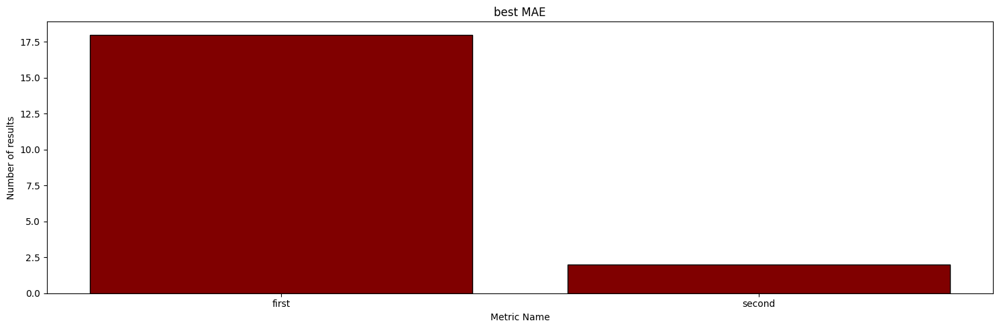

In [68]:
plot_metrics('mae')

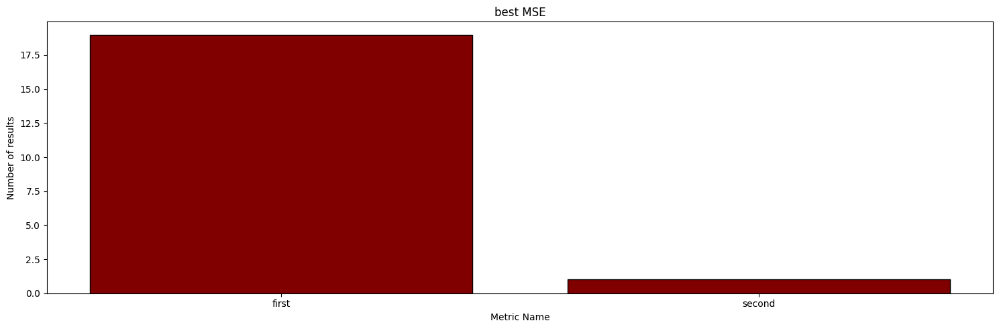

In [69]:
plot_metrics('mse')

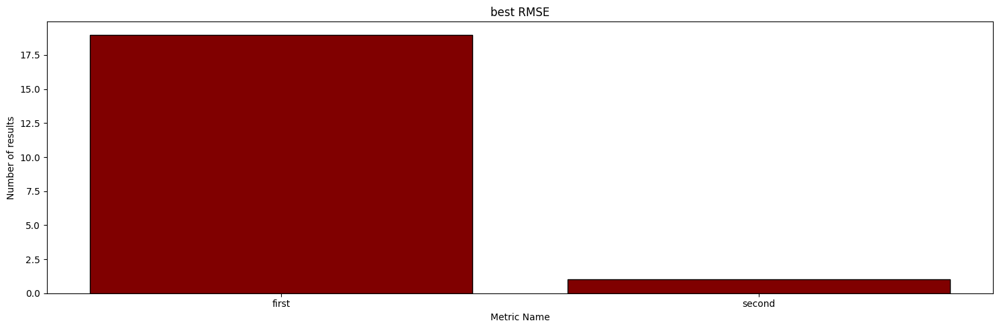

In [70]:
plot_metrics('rmse')

## **Перевіримо кількість спільних рекомендацій**

In [71]:
from termcolor import colored, cprint

In [72]:
from functools import reduce

In [73]:
for user in unique_users:
    dfs = [    
        user_hybrid_recs_first[user],
        user_hybrid_recs_second[user]
    ]
    n_sim = reduce(lambda left, right: pd.merge(left, right, how='inner'), dfs).shape
    print(colored(f'for user {user:<15} first and second approach {n_sim}', 'red' if n_sim[0] == 0 else 'green'))

for user 83091a7e80d342d26edca3c56215c60520c99b02 first and second approach (0, 24)
for user 37b15f2c47bcf8cd3c3891a215154bf0d08df2a4 first and second approach (0, 24)
for user 780085cf7345343488d021fa5ffe30c018a69992 first and second approach (0, 24)
for user 99c483a27234281d69511eb2321267d77430aa6d first and second approach (0, 24)
for user 4a5ac559ccf0bddb4a3fa5011482fd8016984f0d first and second approach (0, 24)
for user 3b93435988354b1889de1e71810d1dd65c4ba17c first and second approach (0, 24)
for user 35ee179ddf1672c2202d01c7240d85b0919ac270 first and second approach (0, 24)
for user fce4538d7a099bab3ef81533a76be87891f15f5f first and second approach (0, 24)
for user f3825861e5575cf4206f883630754fa30c80721e first and second approach (0, 24)
for user 999ef0f2add07810255a5f6e5629b796a04c4b89 first and second approach (0, 24)
for user 14e0ed2417792d3a950469330a10f1cd1f07e7ec first and second approach (0, 24)
for user a771391d088269c5dc7adcc9e7e0e77d3cf8b80b first and second approach 

## **Перевіримо кількість співпадінь з прослуханими треками**

In [77]:
for user in unique_users:
    user_tracks = df_users[df_users['user_id'] == user]
    user_tracks_ids = user_tracks['track_id']

    df = user_hybrid_recs_first[user]
    df_filtered = df[df['track_id'].isin(user_tracks_ids)]
    
    n_sim = df_filtered.shape
    print(colored(f'for user {user:<15} {n_sim}', 'red' if n_sim[0] == 0 else 'green'))

for user 83091a7e80d342d26edca3c56215c60520c99b02 (0, 20)
for user 37b15f2c47bcf8cd3c3891a215154bf0d08df2a4 (0, 20)
for user 780085cf7345343488d021fa5ffe30c018a69992 (0, 20)
for user 99c483a27234281d69511eb2321267d77430aa6d (0, 20)
for user 4a5ac559ccf0bddb4a3fa5011482fd8016984f0d (0, 20)
for user 3b93435988354b1889de1e71810d1dd65c4ba17c (0, 20)
for user 35ee179ddf1672c2202d01c7240d85b0919ac270 (0, 20)
for user fce4538d7a099bab3ef81533a76be87891f15f5f (0, 20)
for user f3825861e5575cf4206f883630754fa30c80721e (0, 20)
for user 999ef0f2add07810255a5f6e5629b796a04c4b89 (0, 20)
for user 14e0ed2417792d3a950469330a10f1cd1f07e7ec (0, 20)
for user a771391d088269c5dc7adcc9e7e0e77d3cf8b80b (0, 20)
for user d9e5124935aebeb6b9b169df2d28e1fc658d3566 (0, 20)
for user b4b3b685d2b73f7e62332e312ee1f33208c52851 (0, 20)
for user e2efdaa6343eb453d4a63e90d4de9e989c089171 (0, 20)
for user cf487887e35d1bfb9a08cb1a8db63ad4fdb4f42e (0, 20)
for user 944bf0ef4827e3ac4bbe5f25fd1a5c0136266767 (0, 20)
for user ae2ba

In [78]:
for user in unique_users:
    user_tracks = df_users[df_users['user_id'] == user]
    user_tracks_ids = user_tracks['track_id']

    df = user_hybrid_recs_second[user]
    df_filtered = df[df['track_id'].isin(user_tracks_ids)]
    
    n_sim = df_filtered.shape
    print(colored(f'for user {user:<15} {n_sim}', 'red' if n_sim[0] == 0 else 'green'))

for user 83091a7e80d342d26edca3c56215c60520c99b02 (0, 24)
for user 37b15f2c47bcf8cd3c3891a215154bf0d08df2a4 (0, 24)
for user 780085cf7345343488d021fa5ffe30c018a69992 (0, 24)
for user 99c483a27234281d69511eb2321267d77430aa6d (0, 24)
for user 4a5ac559ccf0bddb4a3fa5011482fd8016984f0d (0, 24)
for user 3b93435988354b1889de1e71810d1dd65c4ba17c (0, 24)
for user 35ee179ddf1672c2202d01c7240d85b0919ac270 (0, 24)
for user fce4538d7a099bab3ef81533a76be87891f15f5f (0, 24)
for user f3825861e5575cf4206f883630754fa30c80721e (0, 24)
for user 999ef0f2add07810255a5f6e5629b796a04c4b89 (0, 24)
for user 14e0ed2417792d3a950469330a10f1cd1f07e7ec (0, 24)
for user a771391d088269c5dc7adcc9e7e0e77d3cf8b80b (0, 24)
for user d9e5124935aebeb6b9b169df2d28e1fc658d3566 (0, 24)
for user b4b3b685d2b73f7e62332e312ee1f33208c52851 (0, 24)
for user e2efdaa6343eb453d4a63e90d4de9e989c089171 (0, 24)
for user cf487887e35d1bfb9a08cb1a8db63ad4fdb4f42e (0, 24)
for user 944bf0ef4827e3ac4bbe5f25fd1a5c0136266767 (0, 24)
for user ae2ba

## **Для кількох випадкових користувачів візулізуймо рекомендації**

In [79]:
def plot_user_recommendation(recommendations:pd.DataFrame, features:list, user_profile:pd.DataFrame):
  num_features = len(features)

  angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False)
  angles = np.append(angles, angles[0])

  values_rs = user_profile[features].values.flatten()
  values_rs = np.append(values_rs, values_rs[0])

  rows = recommendations.shape[0] // 5
  fig, axs = plt.subplots(rows, 5, figsize=(25, 10 * (rows // 2)), subplot_kw={'projection': 'polar'}, layout='constrained')
  fig.suptitle(f'Visualization of User Recommendations (hybrid)', fontsize=16, fontweight='bold')

  for i, (index, rec) in enumerate(recommendations.iterrows()):
      row = i // 5
      col = i % 5

      values = rec[features].values
      values = np.append(values, values[0])

      ax = axs[row, col]
      ax.fill(angles, values, color='maroon', alpha=0.25)
      ax.plot(angles, values, color='maroon', linewidth=2)
      ax.fill(angles, values_rs, color='yellow', alpha=0.1)
      ax.plot(angles, values_rs, color='yellow', linewidth=2)
      ax.set_xticks(angles[:-1])
      ax.set_xticklabels(features, fontsize=8)
      ax.set_yticklabels([])
      ax.set_title(f'{rec["name"]}\nby {rec["artist"]}',size='medium', fontweight='bold')

  plt.show()

### **Оберемо кількох користувачів**

In [84]:
from numpy import random

In [92]:
users_to_visualize = []
for _ in range(5):
    users_to_visualize.append(random.choice(unique_users))

## Для користувача 1

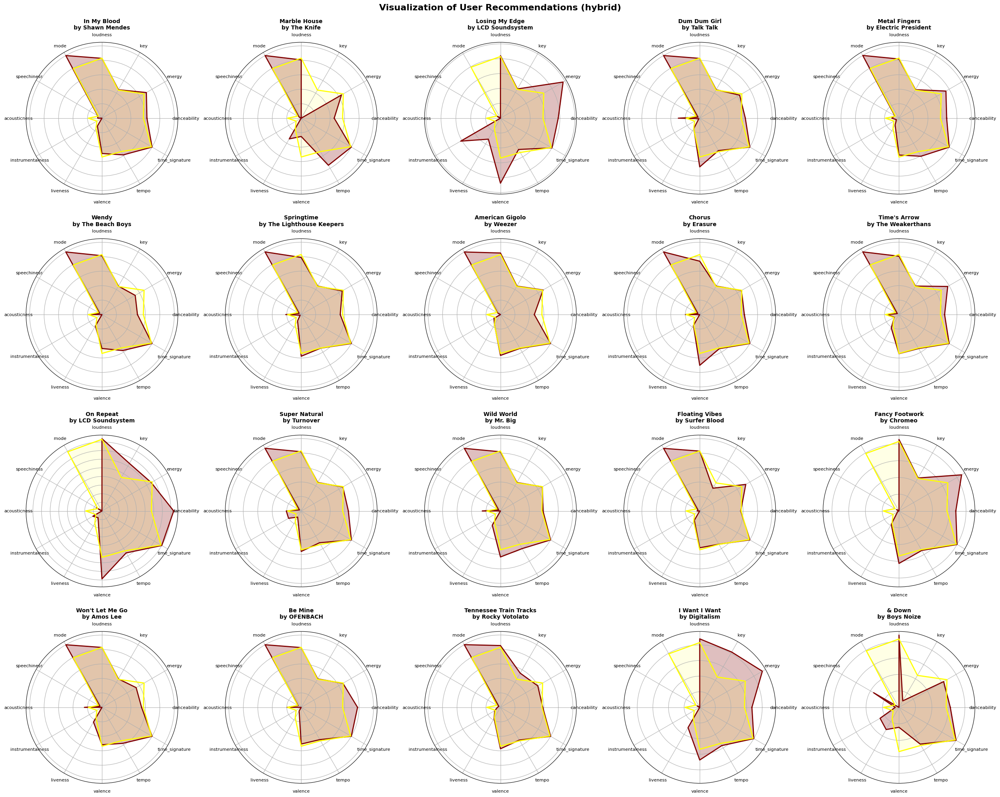

In [96]:
user_id = users_to_visualize[0]
plot_user_recommendation(
    recommendations=user_hybrid_recs_first[user_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)

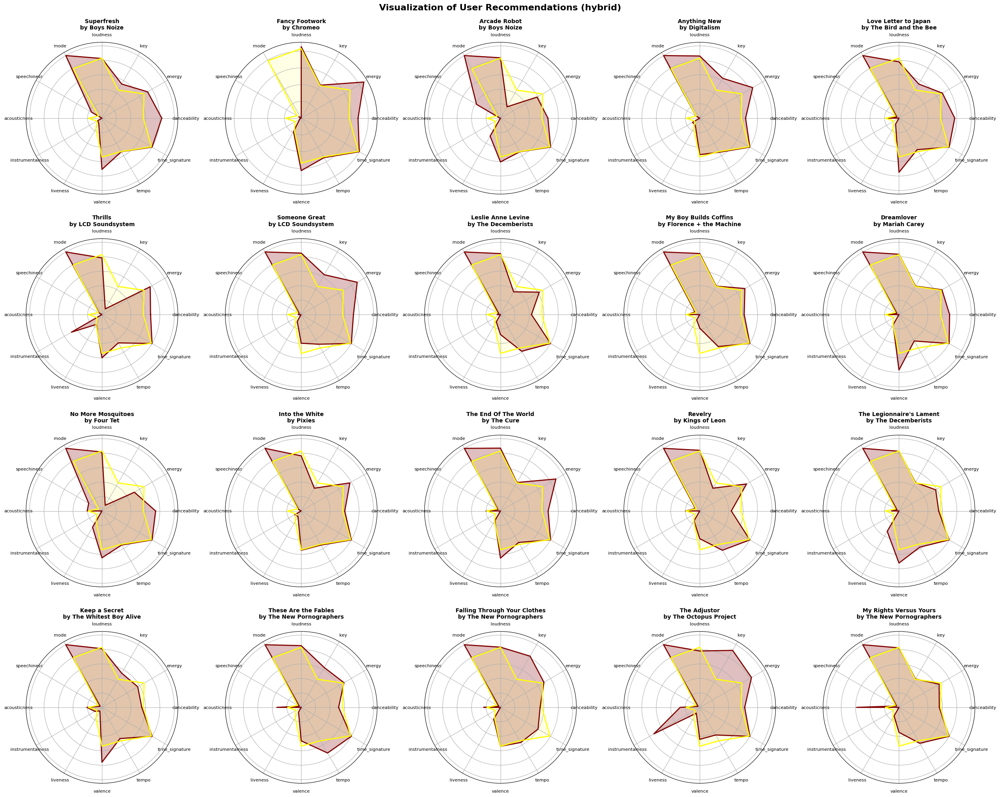

In [97]:
user_id = users_to_visualize[0]
plot_user_recommendation(
    recommendations=user_hybrid_recs_second[user_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)

## Для користувача 2

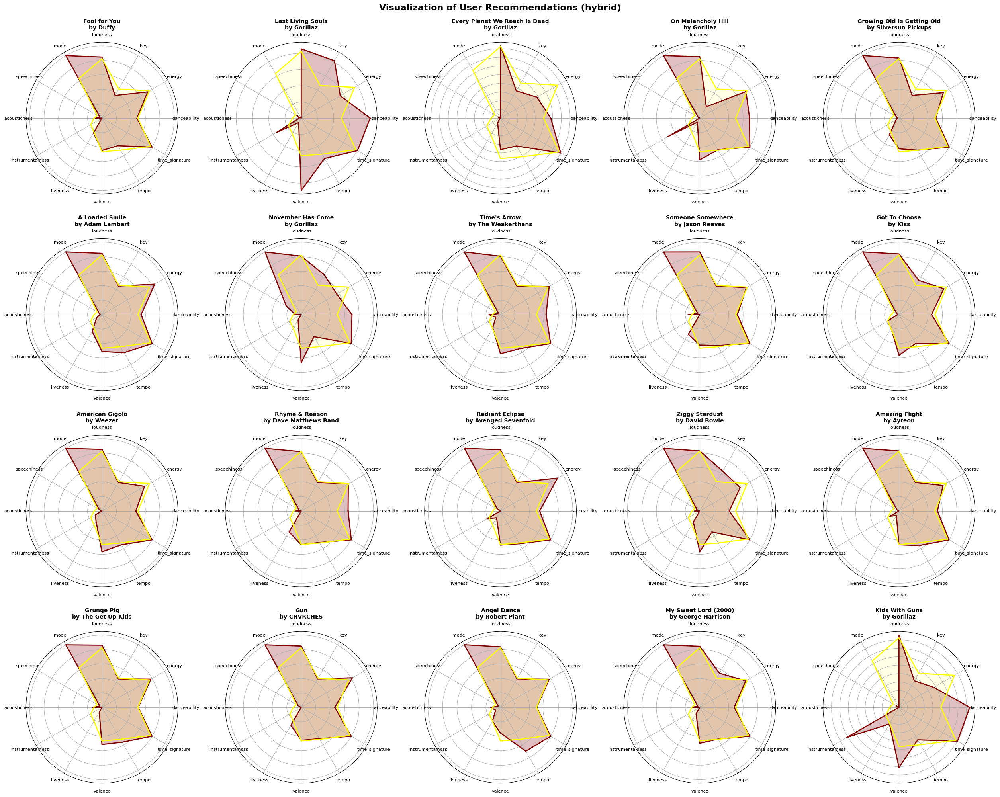

In [98]:
user_id = users_to_visualize[1]
plot_user_recommendation(
    recommendations=user_hybrid_recs_first[user_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)

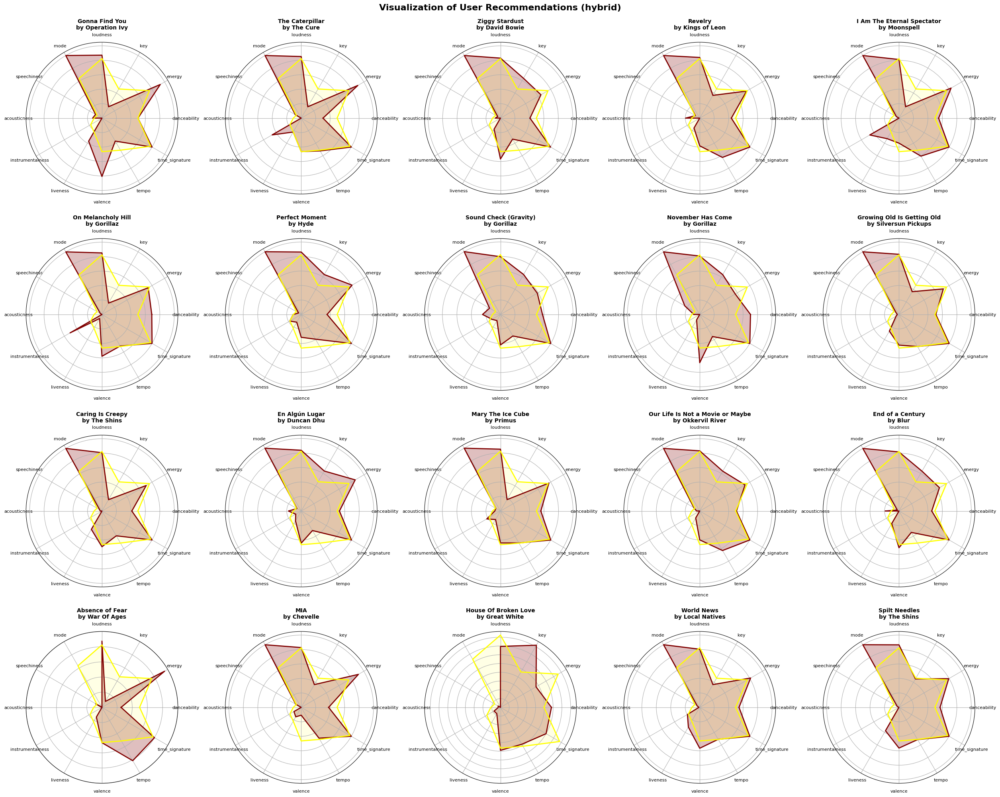

In [99]:
user_id = users_to_visualize[1]
plot_user_recommendation(
    recommendations=user_hybrid_recs_second[user_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)

## Для користувача 3

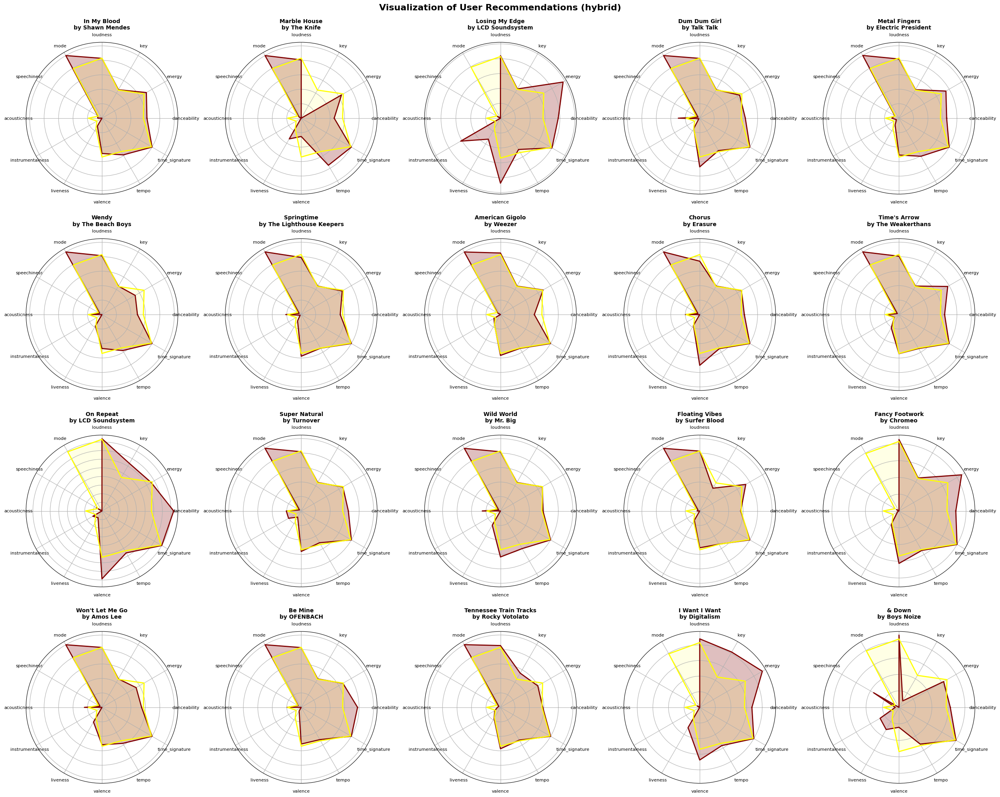

In [101]:
user_id = users_to_visualize[2]
plot_user_recommendation(
    recommendations=user_hybrid_recs_first[ususer_id = users_to_visualize[2]
plot_user_recommendation(
    recommendations=user_hybrid_recs_first[user_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)er_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)

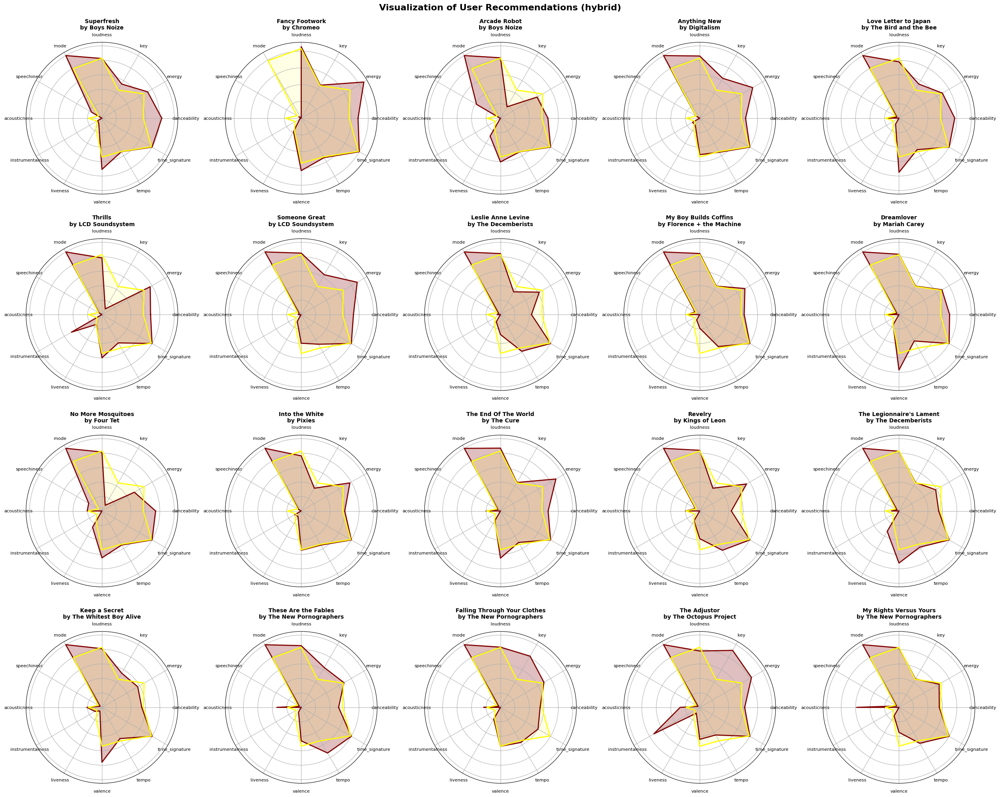

In [102]:
user_id = users_to_visualize[2]
plot_user_recommendation(
    recommendations=user_hybrid_recs_second[user_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)

## Для користувача 4

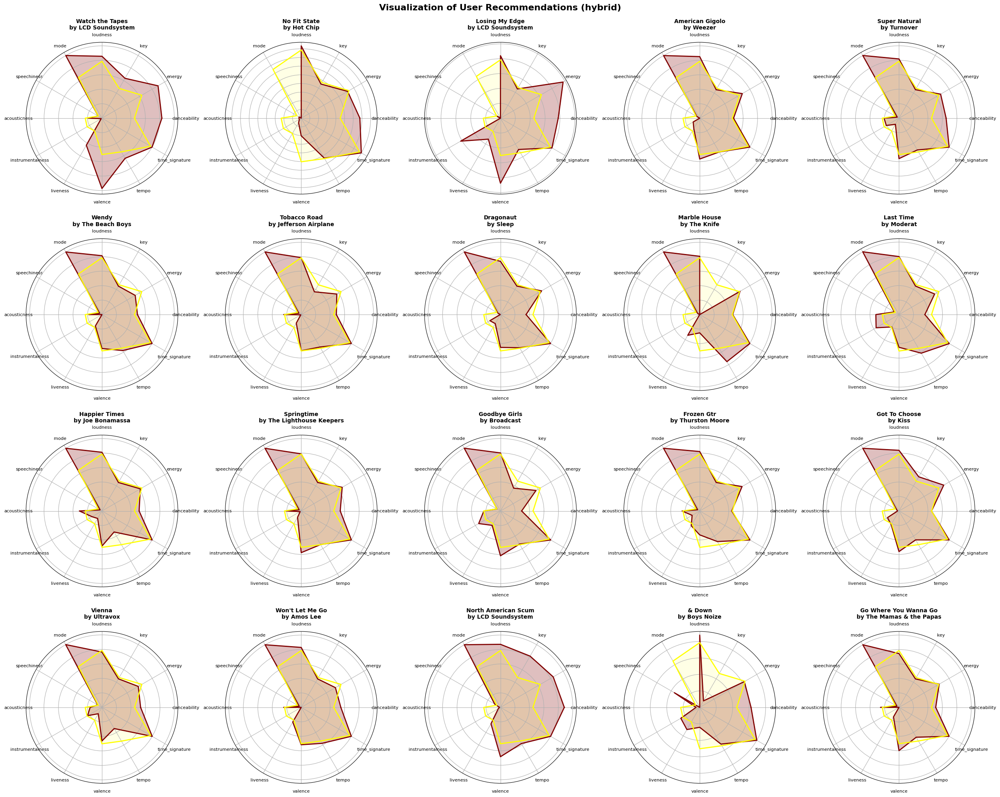

In [103]:
user_id = users_to_visualize[3]
plot_user_recommendation(
    recommendations=user_hybrid_recs_first[user_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)

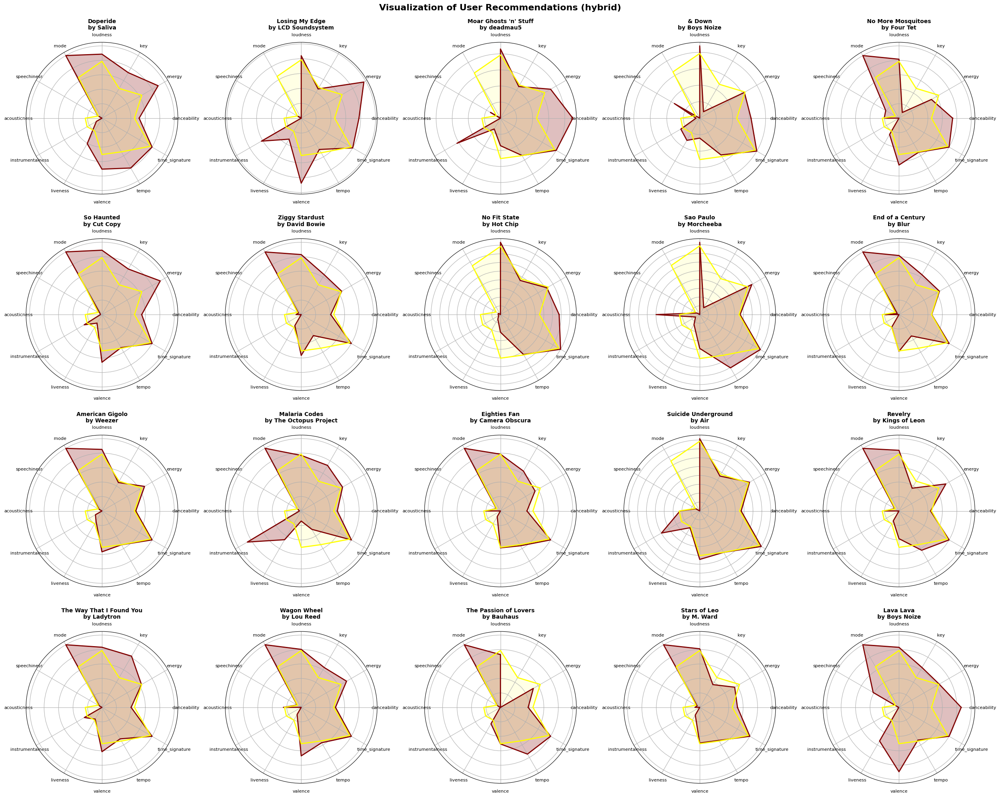

In [104]:
user_id = users_to_visualize[3]
plot_user_recommendation(
    recommendations=user_hybrid_recs_second[user_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)

## Для користувача 5

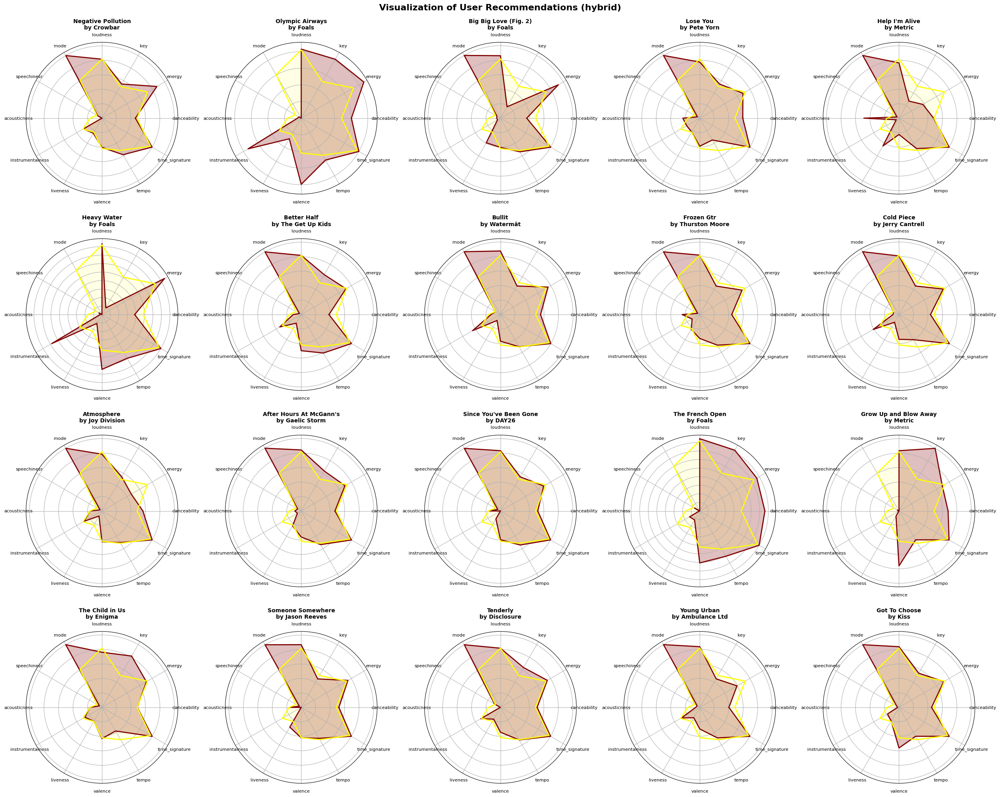

In [105]:
user_id = users_to_visualize[4]
plot_user_recommendation(
    recommendations=user_hybrid_recs_first[user_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)

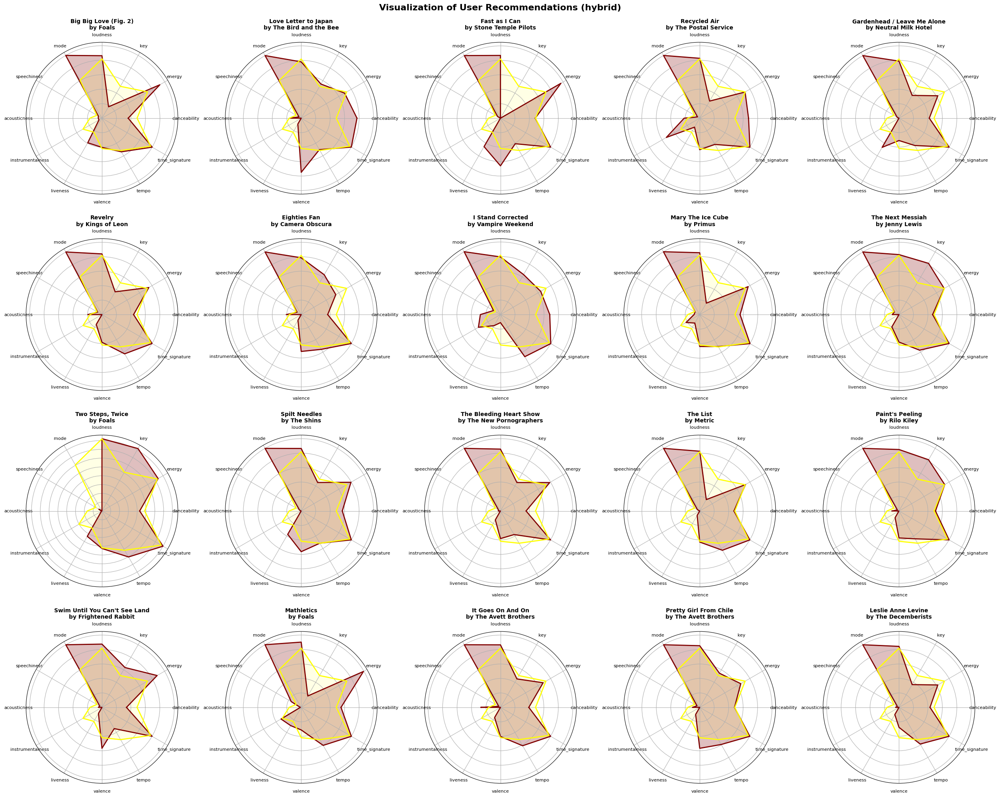

In [106]:
user_id = users_to_visualize[4]
plot_user_recommendation(
    recommendations=user_hybrid_recs_second[user_id],
    features=features,
    user_profile=df_profiles[df_profiles.index == user_id]
)